In [25]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle
import pathlib
import PIL
from fastprogress.fastprogress import progress_bar
from random import sample
    
from tensorflow.keras import layers
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.utils import img_to_array 
from keras.applications.vgg16 import preprocess_input

from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19 
from keras.models import Model

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

In [12]:
def load_images(filepath):
    os.chdir(filepath)
    images = []
    
    with os.scandir(filepath) as files:
        for file in files:
            if file.name.endswith('.png'):
                images.append(file.name)
    return images

In [13]:
images = load_images('../images')
len(images)

62159

In [14]:
def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

In [20]:
from keras.applications.vgg16 import VGG16
from keras.models import Model


In [27]:
def model_vgg16(filepath):
    model16 = VGG16()
    model16 = Model(inputs=model16.inputs, outputs=model16.layers[-2].output)

    data = {}
    p = filepath

    # loop through each image in the dataset
    for image in progress_bar(images):
        # try to extract the features and update the dictionary
        try:
            feat = extract_features(image,model16) ### CHANGE MODEL HERE AS NEEDED
            data[image] = feat
    # if something fails, save the extracted features as a pickle file (optional)
        except:
            print('except')
            with open(p,'wb') as file:
                pickle.dump(data,file)
    filenames = np.array(list(data.keys()))
    feat = np.array(list(data.values()))
    feat = feat.reshape(-1,4096)
    
    pd.DataFrame(feat).to_csv('../model/vgg16_feat.csv')
    pd.DataFrame(filenames).to_csv('..model/vgg16_filenames.csv')
    
    return filenames, feat

In [28]:
vgg16_filenames, vgg16_feat = model_vgg16('../images')

1/1 [==============================] - 0s 36ms/step


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 [==============================] - 0s 48ms/step


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 [==============================] - ETA: 0s

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 [==============================] - 0s 48ms/step


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1/1 [==============================] - 0s 43ms/step


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [42]:
def get_clusters(filenames, feat):
    pca = PCA(n_components=100, random_state=22)
    pca.fit(feat)
    x = pca.transform(feat)
    
    kmeans = KMeans(n_init = 'auto',n_clusters=40, random_state=22)
    kmeans.fit(x)

    groups = {}
    for file, cluster in zip(filenames,kmeans.labels_):
        if cluster not in groups.keys():
            groups[cluster] = []
            groups[cluster].append(file)
        else:
            groups[cluster].append(file)
    
    pd.DataFrame(kmeans.labels_).to_csv('../model/vgg16_PCA100_labels40.csv')       
    
    return kmeans.labels_, groups

In [49]:
def view_cluster(groups):
    plt.figure(figsize = (25,25));
    # gets the list of filenames for a cluster
    files = groups[cluster]
    # only allow up to 20 images to be shown at a time
    if len(files) > 100:
        #print(f"Clipping cluster size from {len(files)} to 10")
        files = sample(files,100)
    # plot each image in the cluster
    for index, file in enumerate(files):
        plt.subplot(10,20,index+1);
        img = load_img(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')
    plt.show()
        


In [44]:
vgg16_kmeans_labels, vgg16_groups = get_clusters(vgg16_filenames, vgg16_feat)

CLUSTER  0


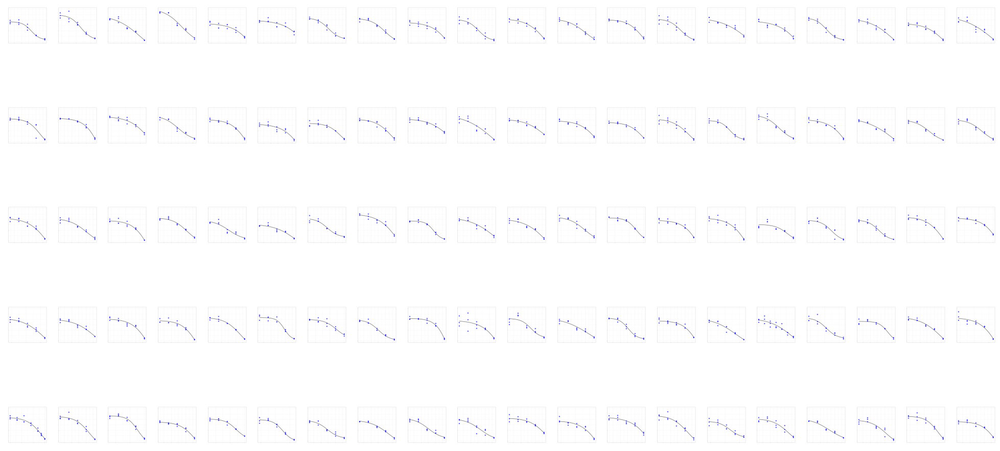

CLUSTER  1


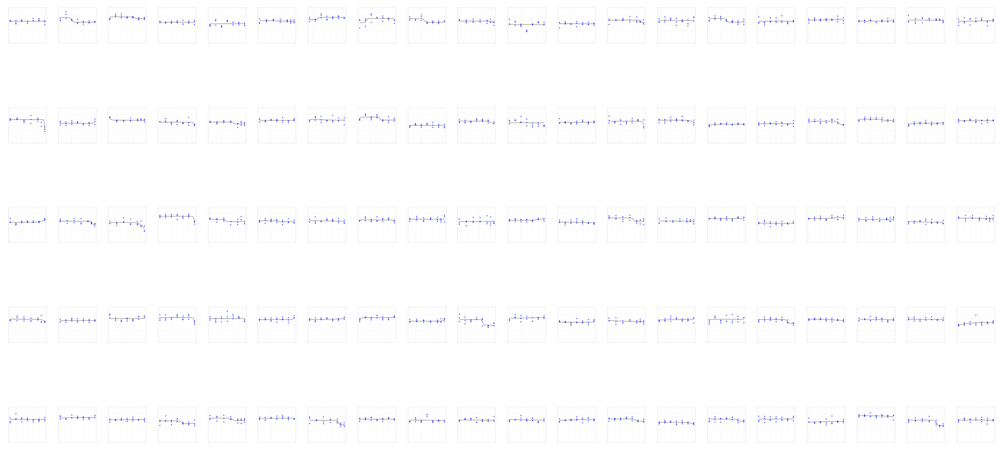

CLUSTER  2


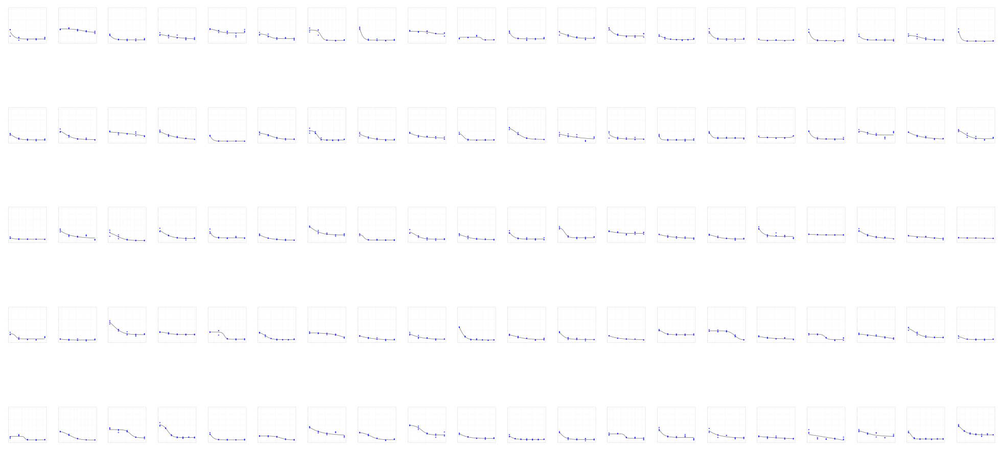

CLUSTER  3


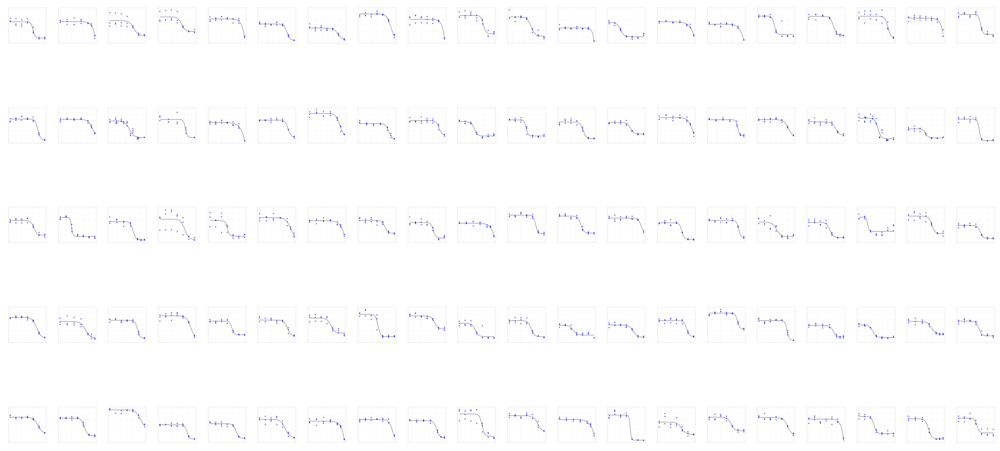

CLUSTER  4


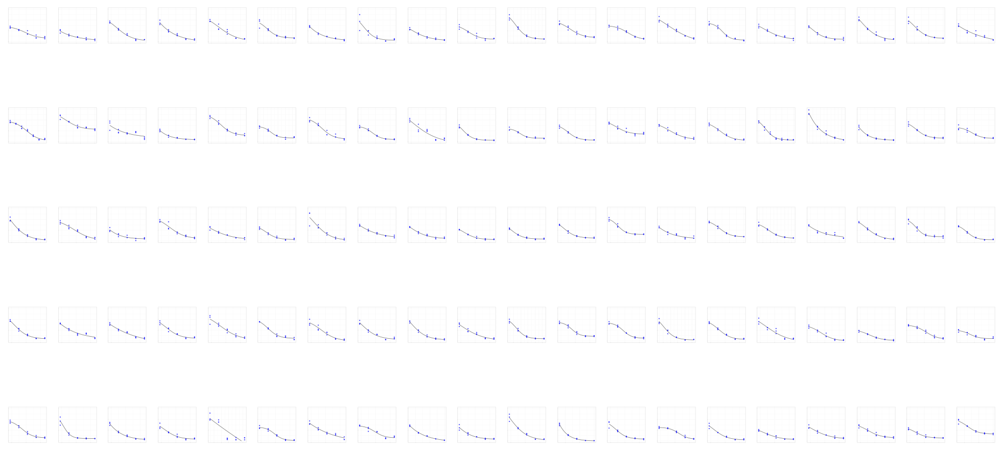

CLUSTER  5


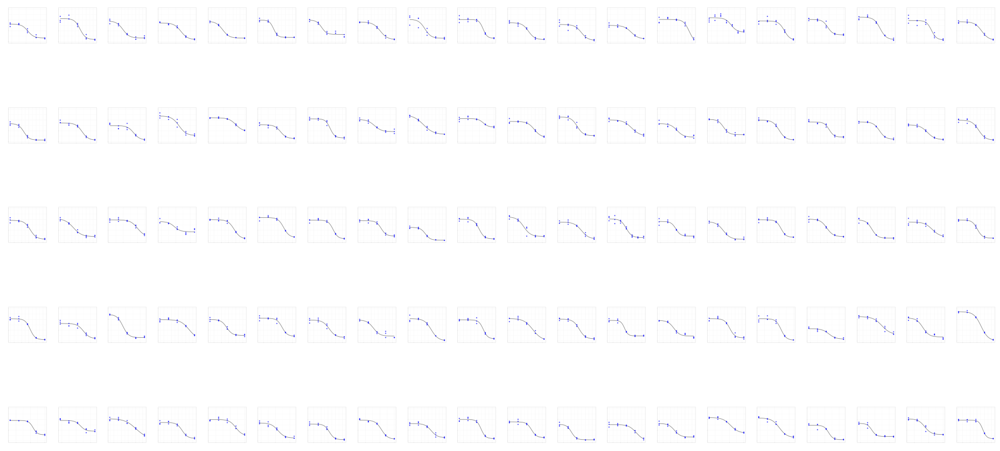

CLUSTER  6


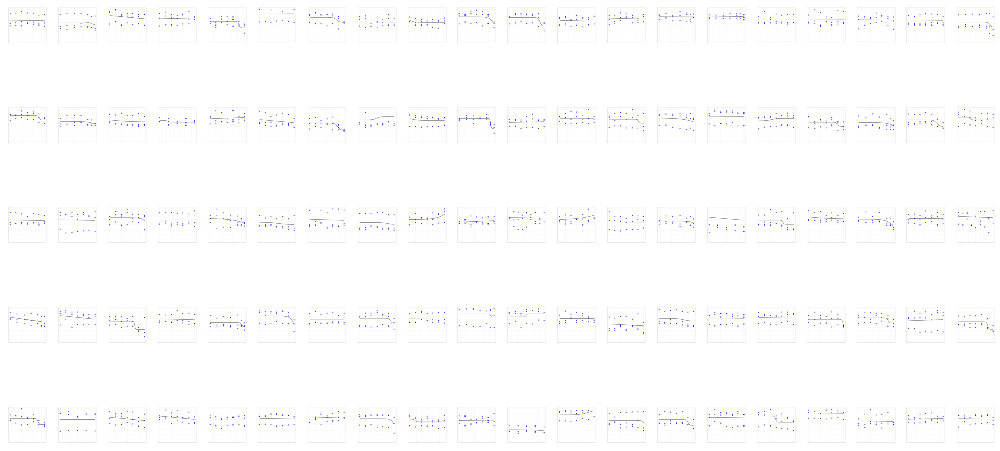

CLUSTER  7


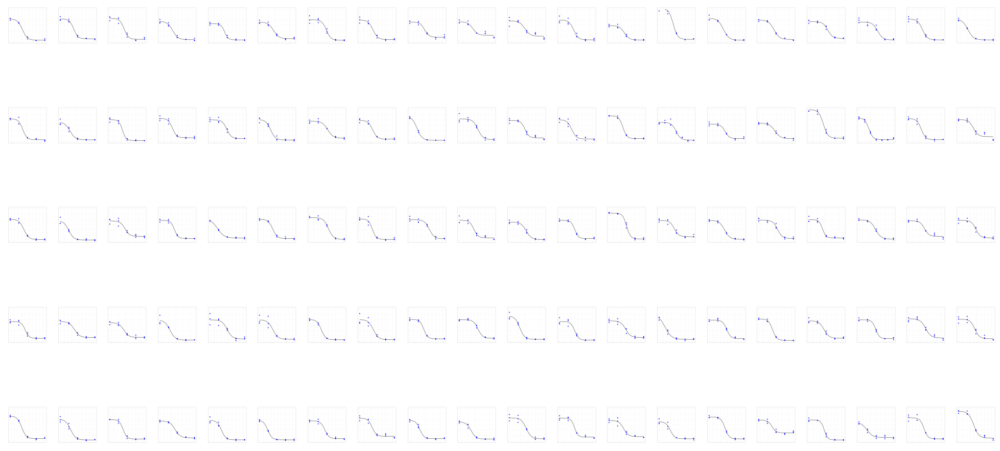

CLUSTER  8


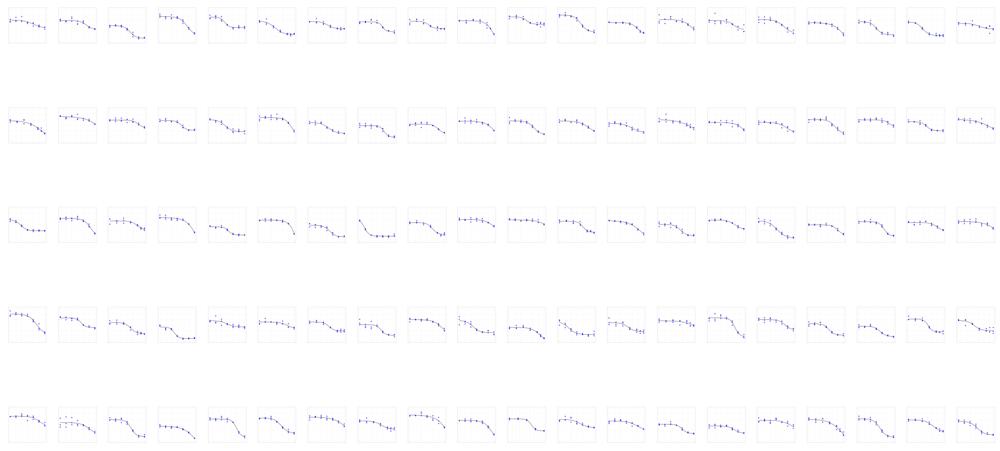

CLUSTER  9


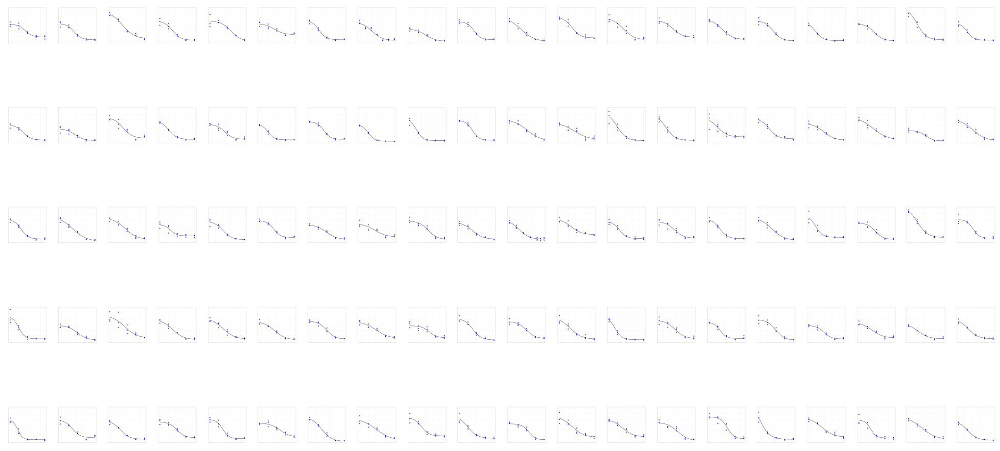

CLUSTER  10


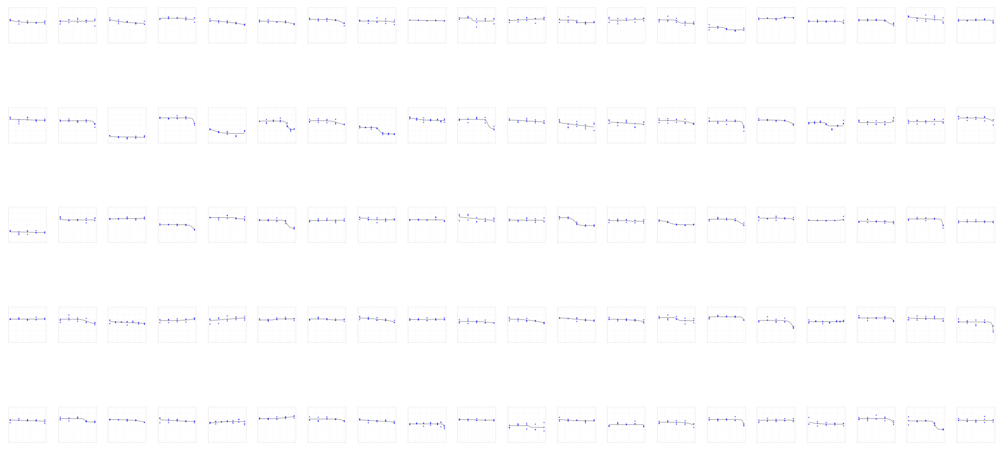

CLUSTER  11


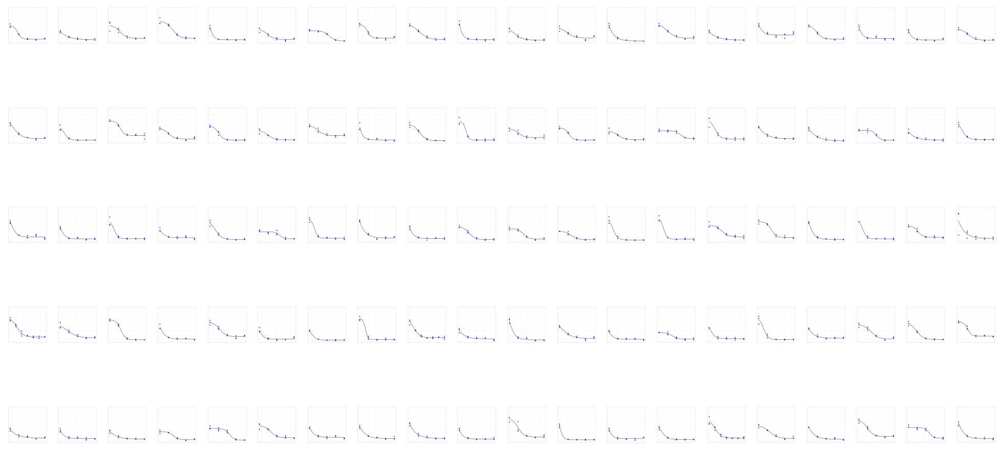

CLUSTER  12


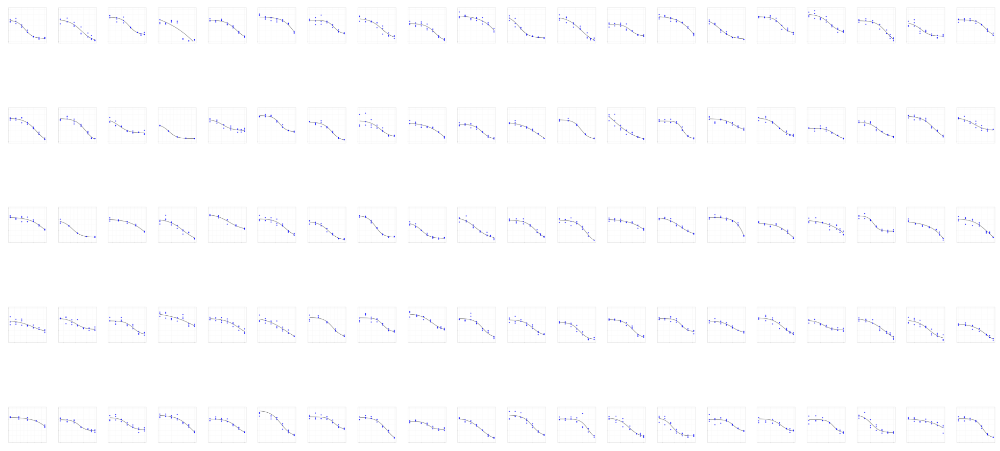

CLUSTER  13


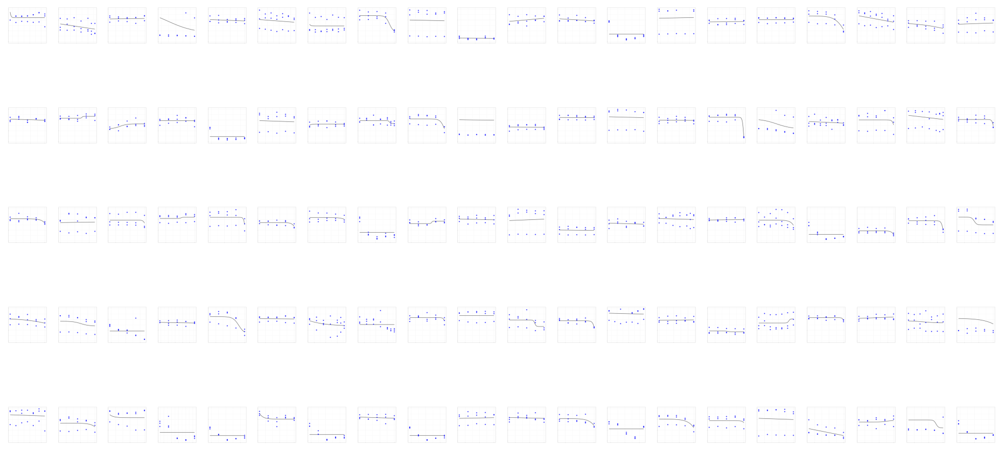

CLUSTER  14


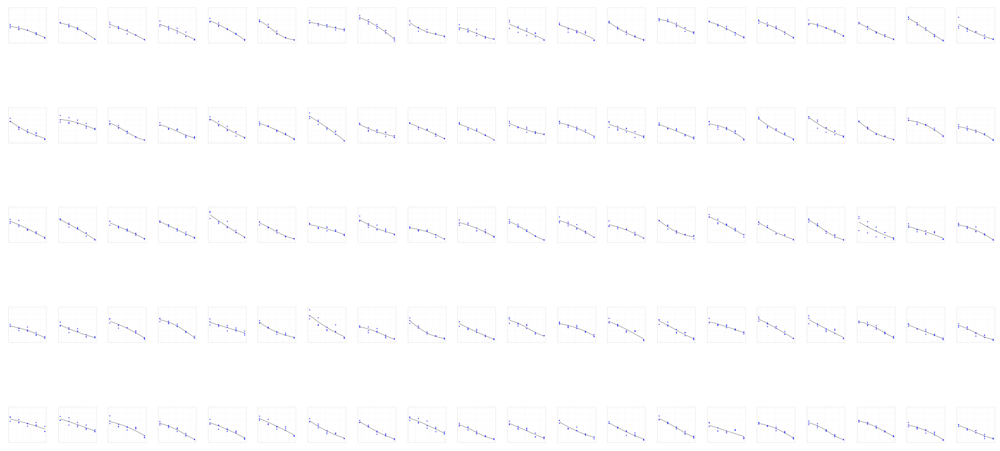

CLUSTER  15


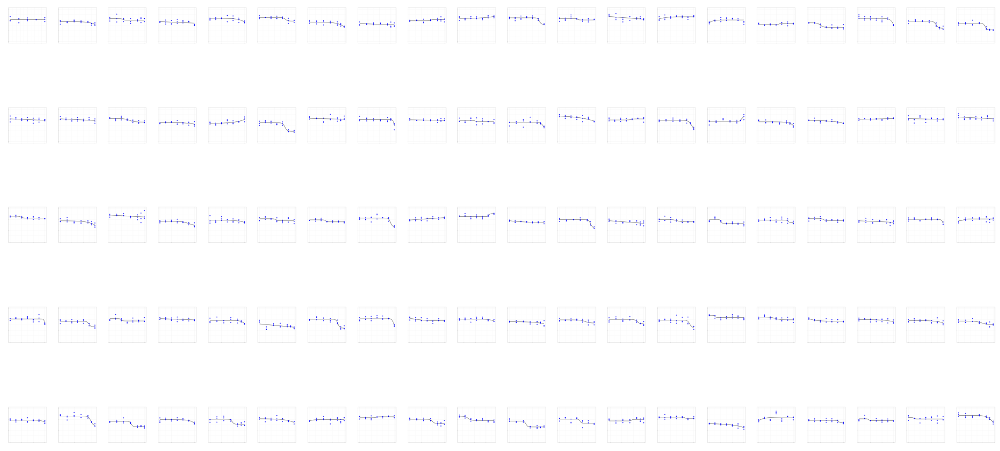

CLUSTER  16


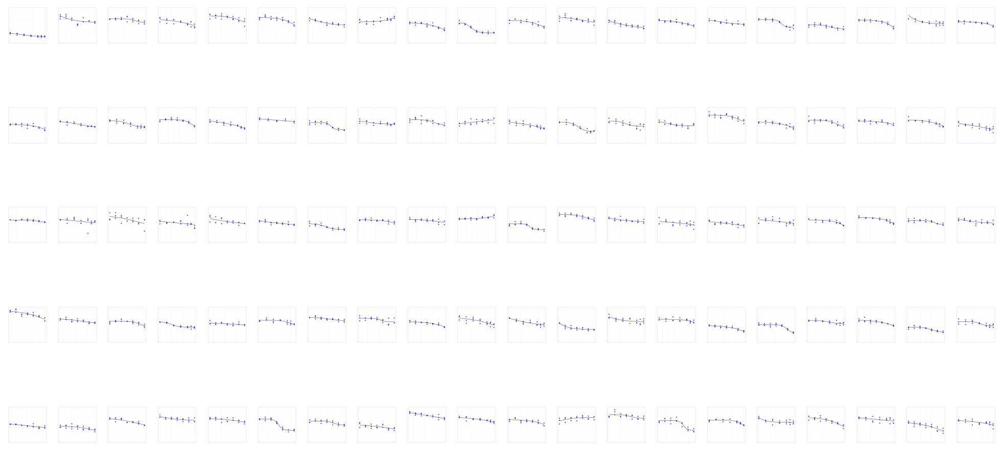

CLUSTER  17


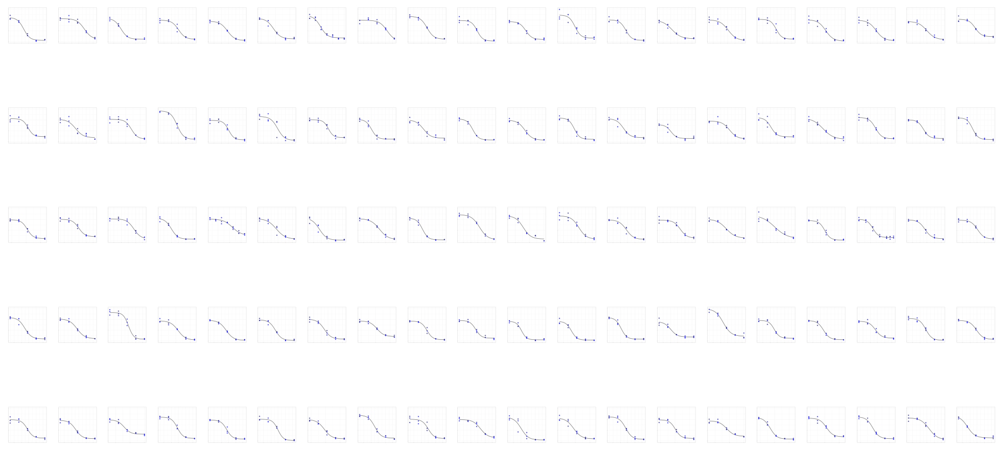

CLUSTER  18


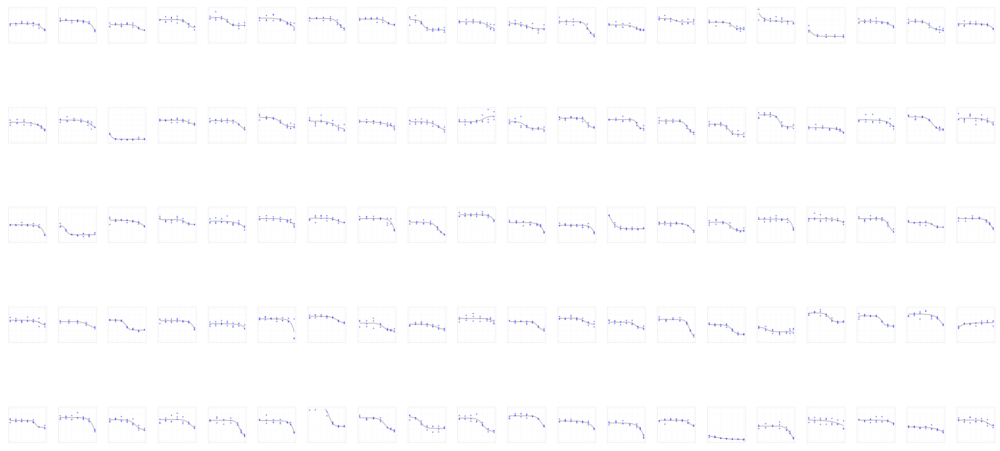

CLUSTER  19


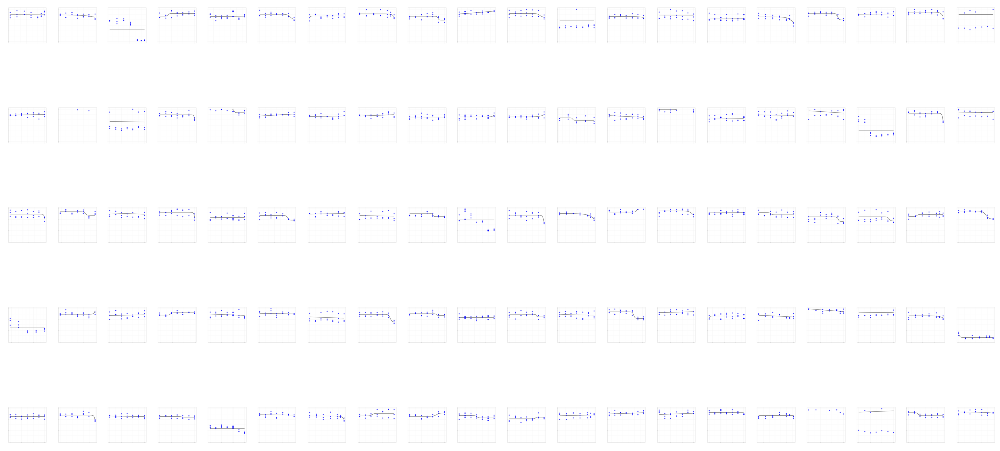

CLUSTER  20


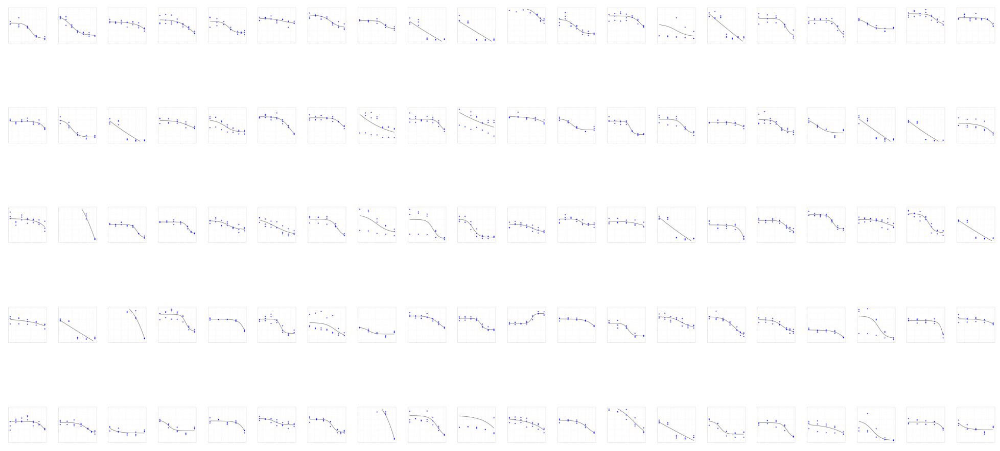

CLUSTER  21


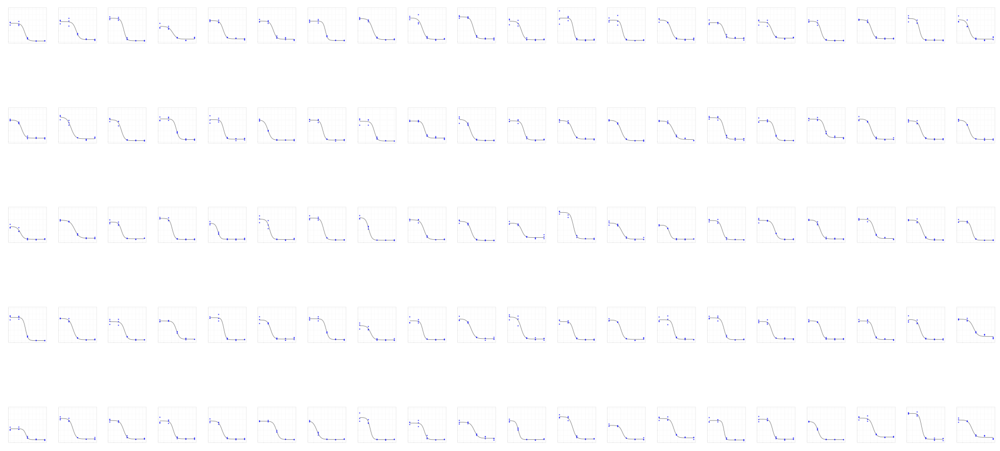

CLUSTER  22


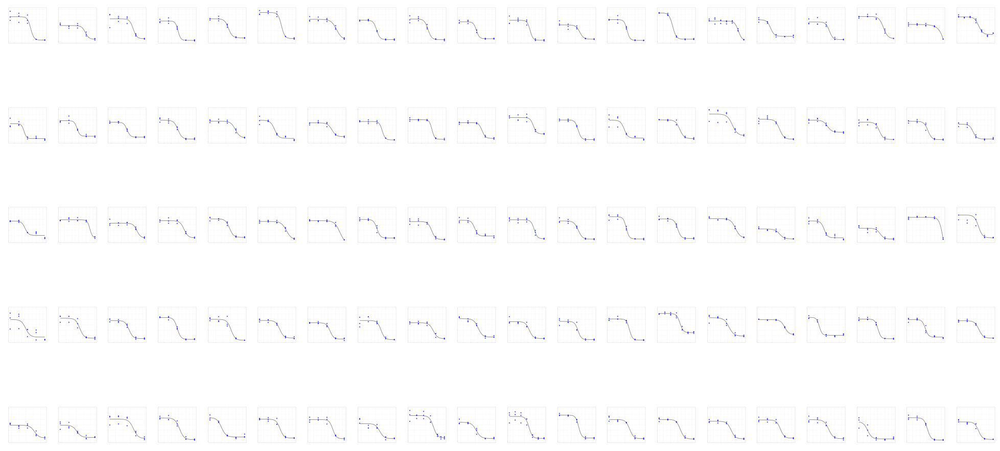

CLUSTER  23


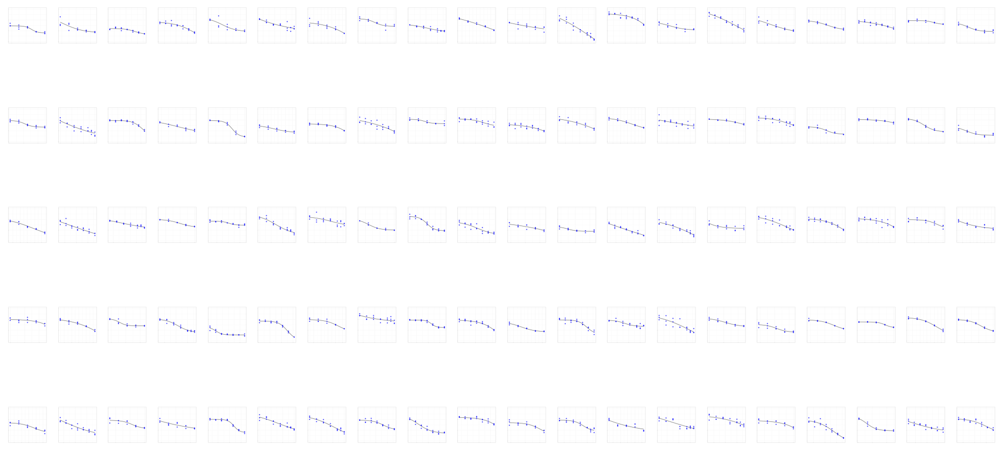

CLUSTER  24


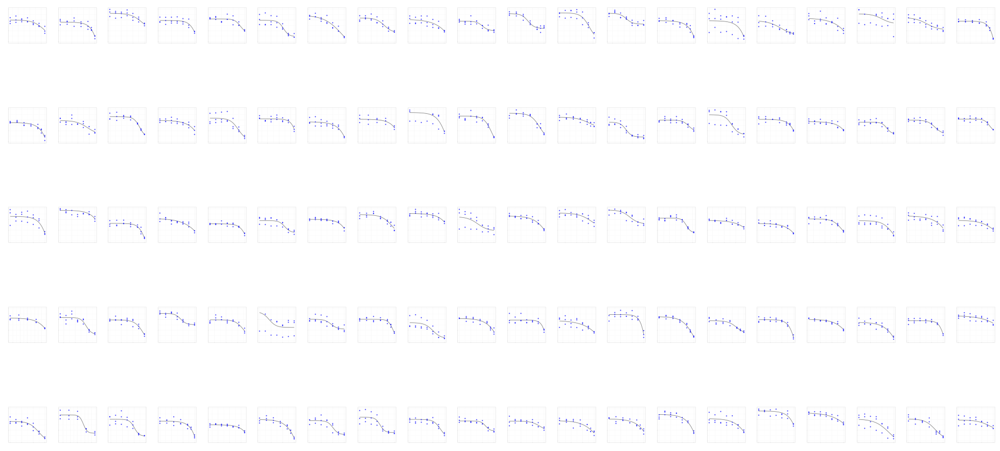

CLUSTER  25


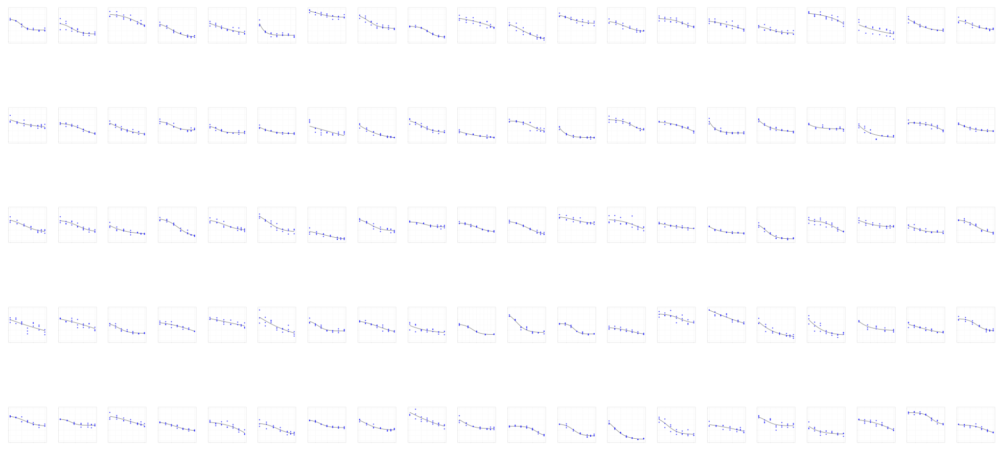

CLUSTER  26


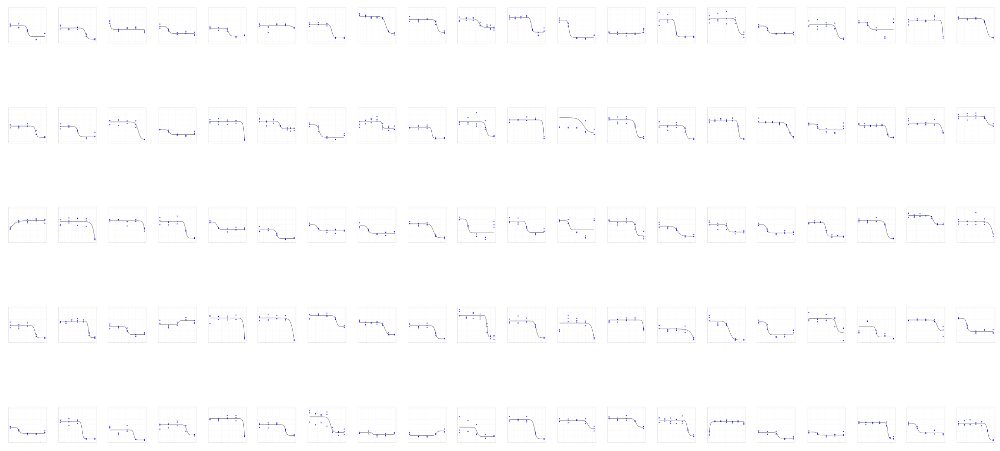

CLUSTER  27


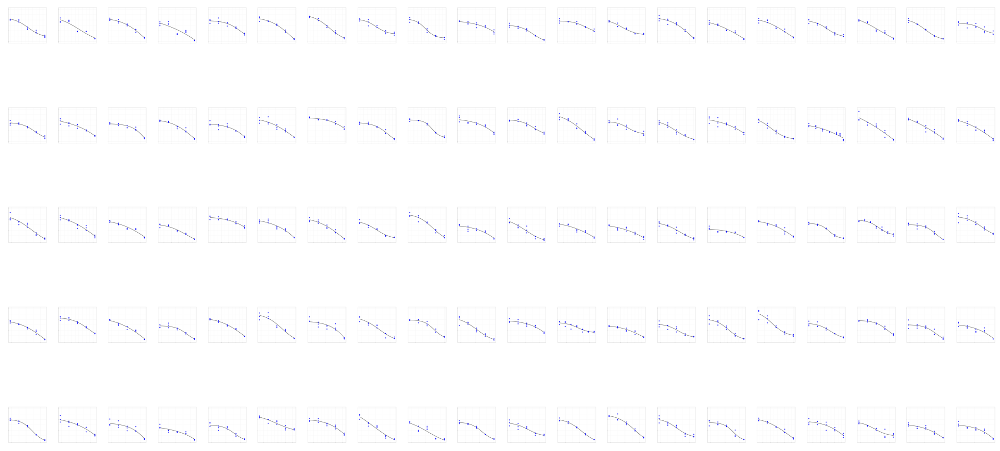

CLUSTER  28


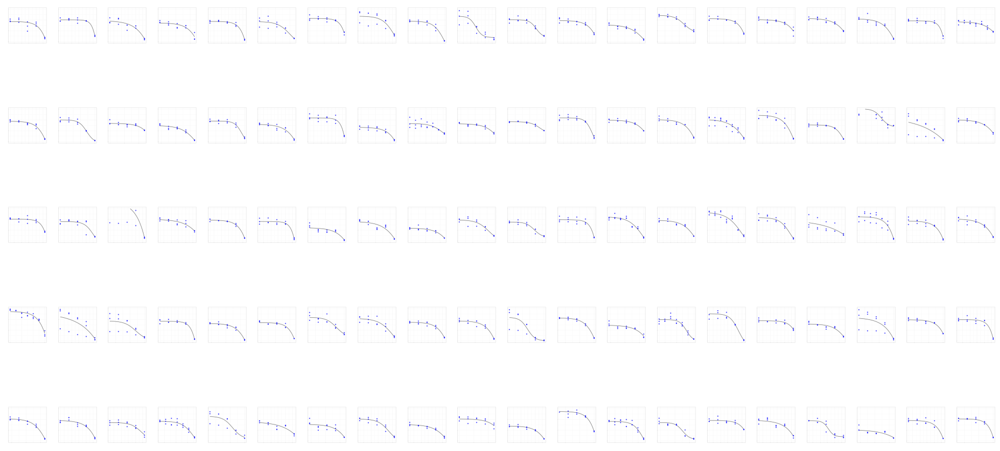

CLUSTER  29


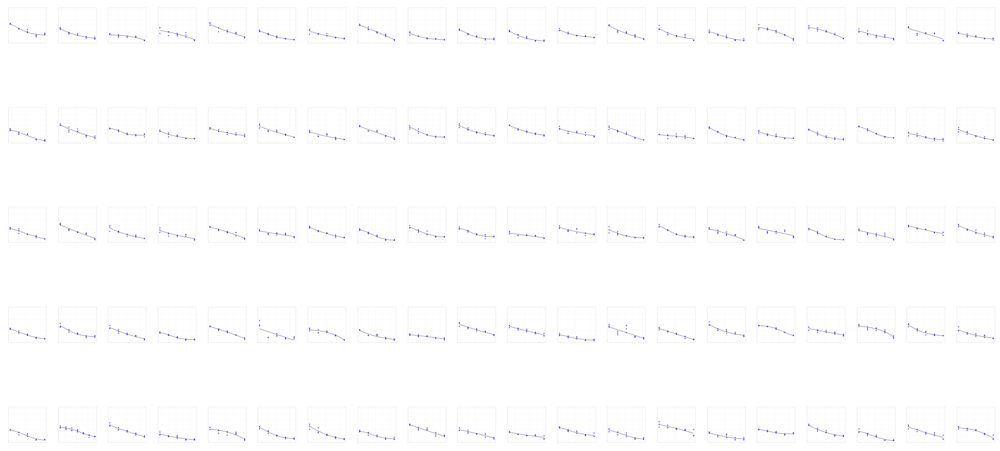

CLUSTER  30


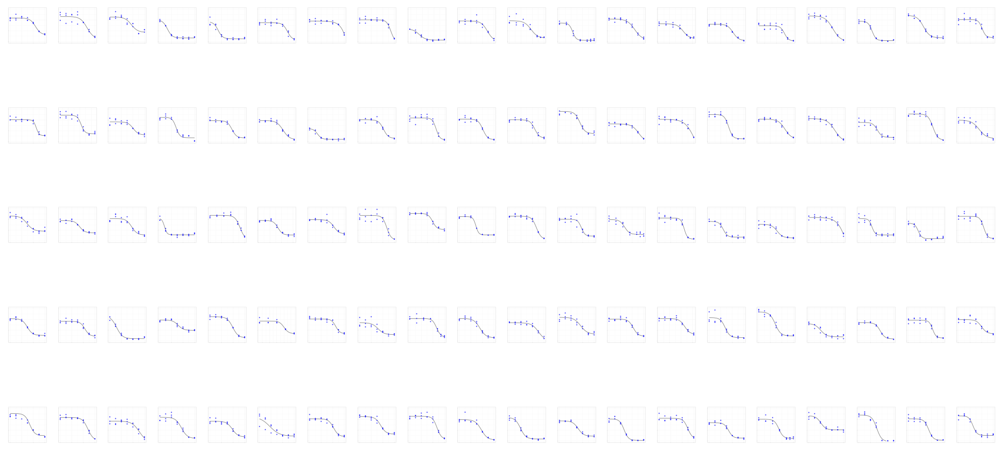

CLUSTER  31


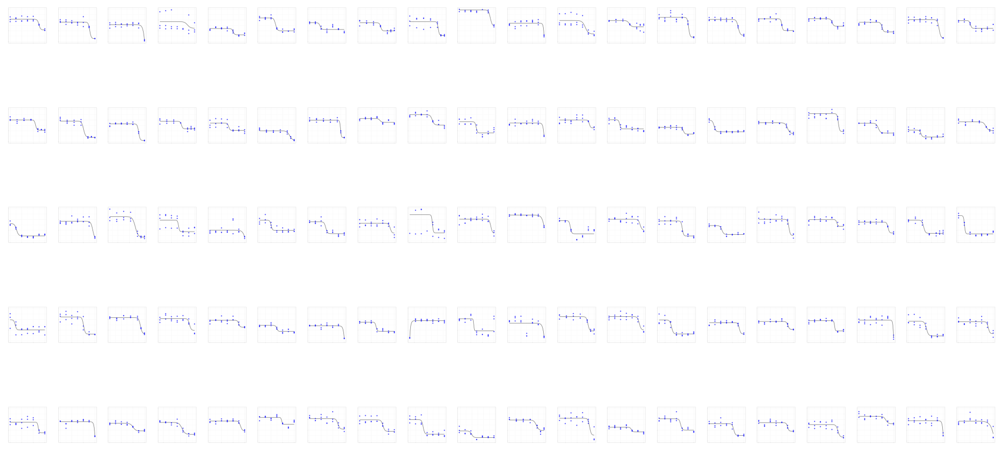

CLUSTER  32


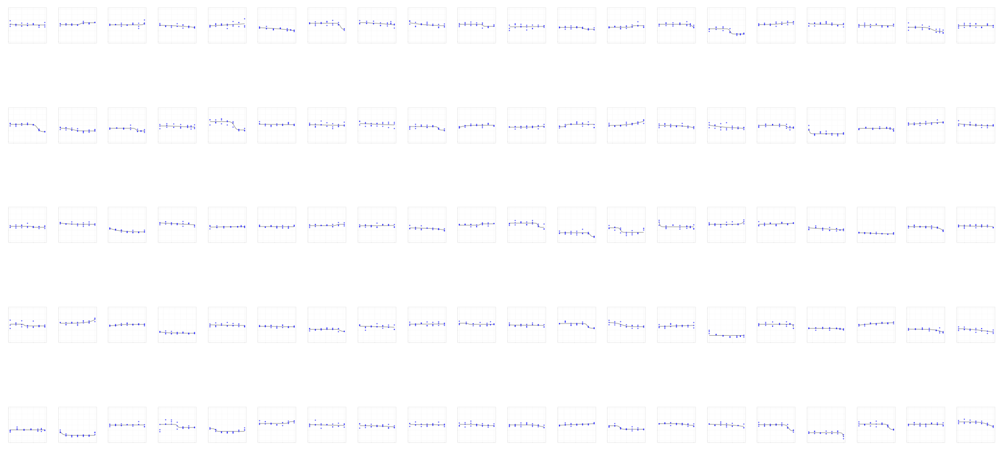

CLUSTER  33


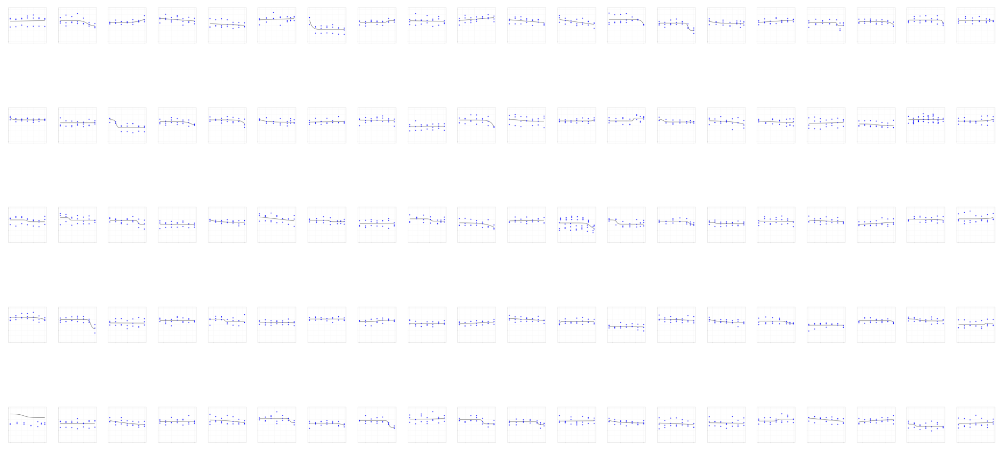

CLUSTER  34


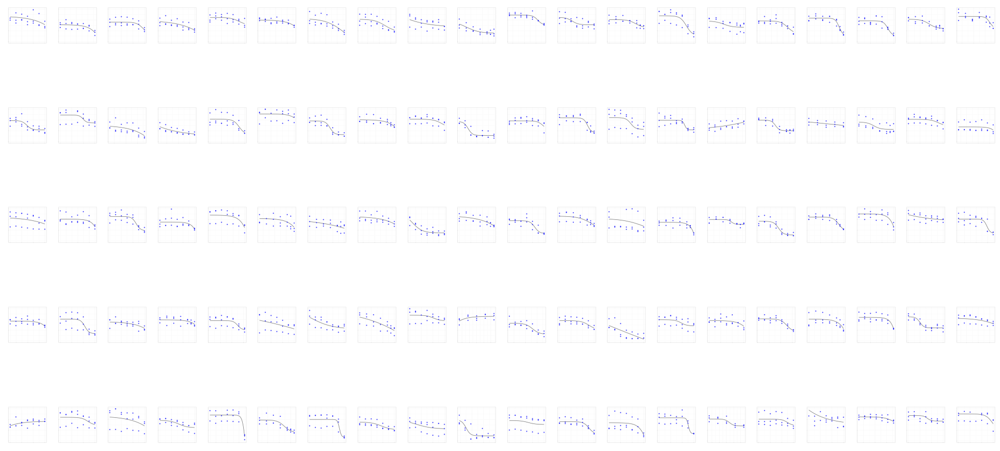

CLUSTER  35


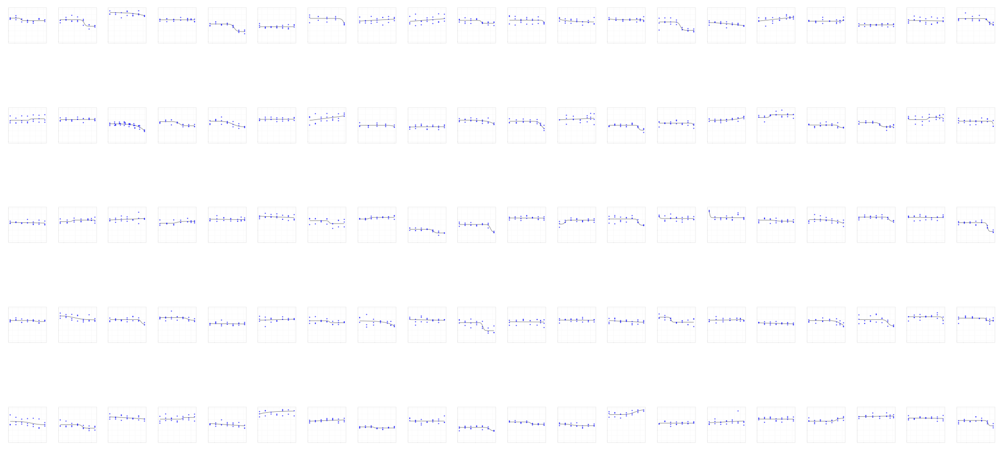

CLUSTER  36


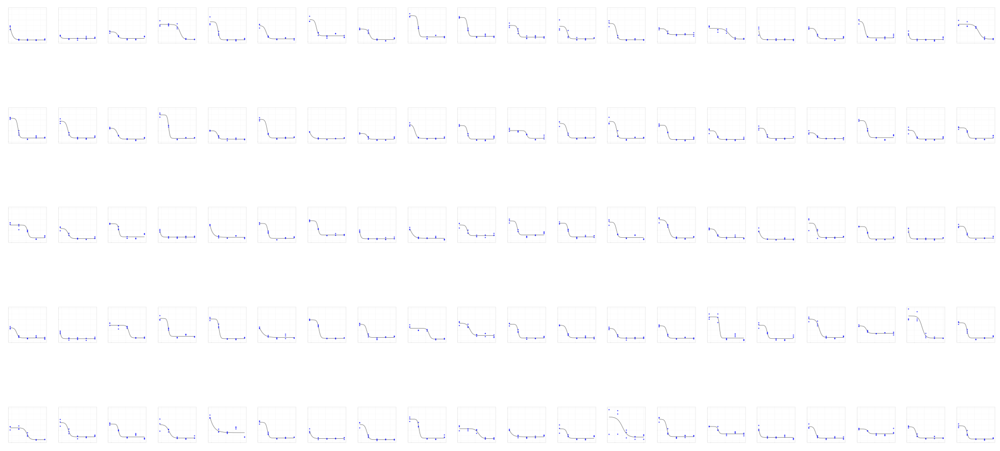

CLUSTER  37


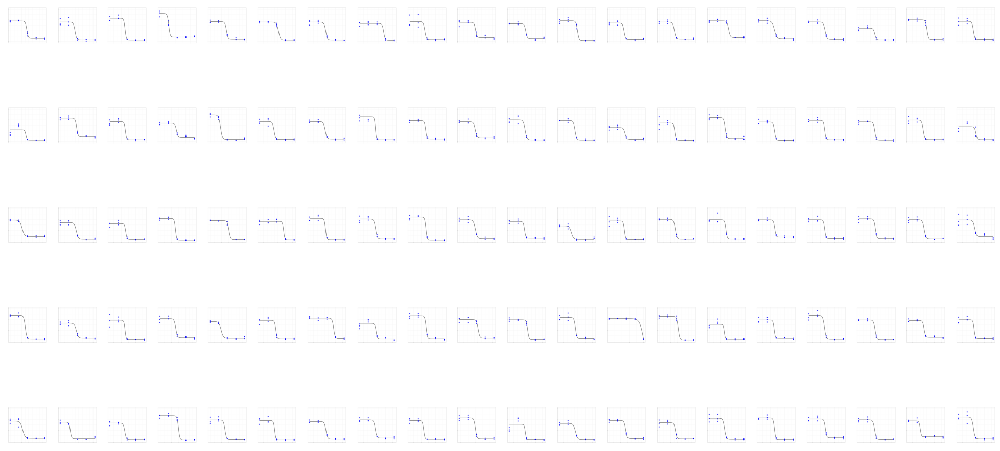

CLUSTER  38


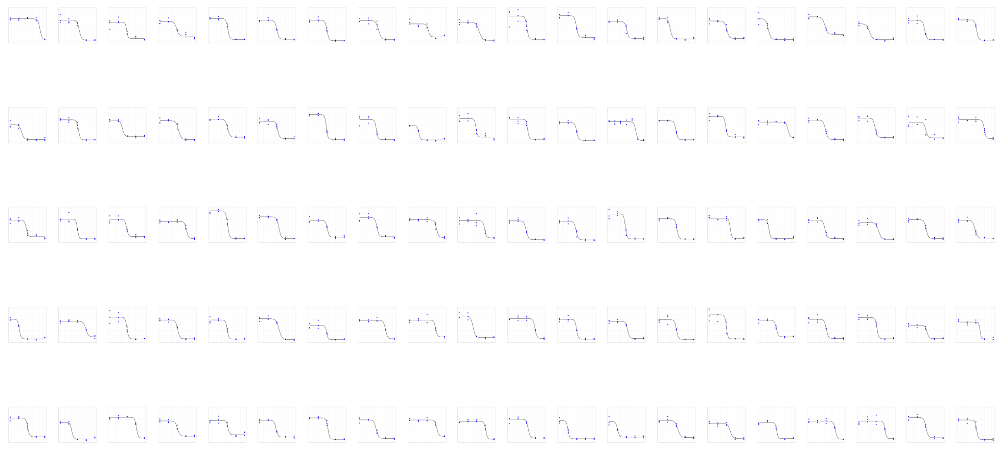

CLUSTER  39


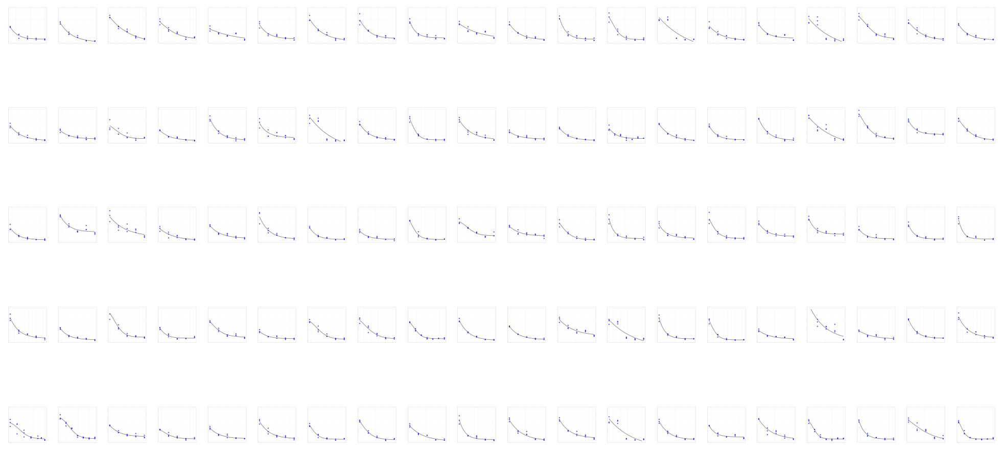

In [50]:
for cluster in range(len(vgg16_groups)):
    print("CLUSTER ",cluster)
    view_cluster(vgg16_groups)

In [46]:
vgg16_groups[34]

['KP-4_1088_490_Glo_400_4_24.png',
 'HCC1937_1179_270_Glo_400_4_6.png',
 'MHH-ES-1_1007_330_Glo_800_4_12.png',
 'SNU-C2B_1007_419_Glo_500_4_6.png',
 'C32_1924_527_Glo_900_4_6.png',
 'U-2-OS_1598_284_Glo_625_4_3.png',
 'MHH-ES-1_2010_323_Glo_800_4_6.png',
 'HT-29_1510_323_Glo_200_4_3.png',
 'U-2-OS_1062_516_Glo_625_4_6.png',
 'SW620_1005_284_Glo_350_4_9.png',
 'HCT-15_1083_311_Glo_150_4_9.png',
 'HT-29_1873_527_Glo_200_4_6.png',
 'A375_2048_527_Glo_150_4_3.png',
 'HT-29_1446_711_a_17_a_2100_3_3.png',
 'PC-14_1714_158_Glo_250_4_3.png',
 'PL4_1022_631_Glo_150_4_6.png',
 'MHH-ES-1_2040_323_Glo_800_4_9.png',
 'PC-14_1811_159_Glo_250_4_3.png',
 'U-2-OS_1037_525_Glo_625_4_0.png',
 'SW620_1085_525_Glo_350_4_3.png',
 'RT4_1058_330_Glo_325_4_0.png',
 'BT-474_1013_341_Glo_1250_4_9.png',
 'U-2-OS_1598_525_Glo_625_4_0.png',
 'HT-29_2109_527_Glo_200_4_6.png',
 'HT-29_1191_525_Glo_200_4_6.png',
 'MHH-ES-1_1190_330_Glo_800_4_9.png',
 'MFM-223_1058_419_Glo_450_4_9.png',
 'U-2-OS_1629_527_Glo_625_4_6.pn